In [1]:
import logging

import anndata
import numpy as np
import pandas as pd
import plotnine as p
import matplotlib.pyplot as plt
import scanpy as sc
from scipy import sparse
import scvi
from scvi.model.utils import mde
import scHPL
import torch
from tqdm import tqdm

import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings('ignore')
from IPython.display import display

Global seed set to 0


In [2]:
adata = anndata.read('../230905 - Fraction counts outside CI vs reconstuction error over epochs/GSE214695.h5ad')
display(adata)

AnnData object with n_obs × n_vars = 60952 × 33538
    obs: 'sample_name', 'total_counts'
    var: 'gene_id', 'feature_type'

In [5]:
adata.obs['donor'] = adata.obs['sample_name'].str.split('_').str.get(-1)

In [7]:
adata.obs['health'] = adata.obs['donor'].str.split('-').str.get(0)

In [40]:
adata.obs['donor']

barcode
AAACCTGAGGTCGGAT-1-0     HC-1
AAACCTGCAAGTCTGT-1-0     HC-1
AAACCTGGTCGTCTTC-1-0     HC-1
AAACCTGGTTATGCGT-1-0     HC-1
AAACCTGTCGGCATCG-1-0     HC-1
                         ... 
TTTGTTGGTAATGTGA-1-17    CD-6
TTTGTTGGTCTAGGTT-1-17    CD-6
TTTGTTGGTGGCTACC-1-17    CD-6
TTTGTTGTCGTCCTTG-1-17    CD-6
TTTGTTGTCGTGTTCC-1-17    CD-6
Name: donor, Length: 60952, dtype: object

In [9]:
scvi.model.SCVI.setup_anndata(
    adata,
    size_factor_key = 'total_counts',
    batch_key = 'donor'
)

model_integrated = scvi.model.SCVI(
    adata,
    gene_likelihood = 'nb'
)

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [10]:
model_integrated.train(50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:29<00:00,  9.38s/it, loss=3.69e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [07:29<00:00,  8.99s/it, loss=3.69e+03, v_num=1]


In [12]:
model = model_integrated

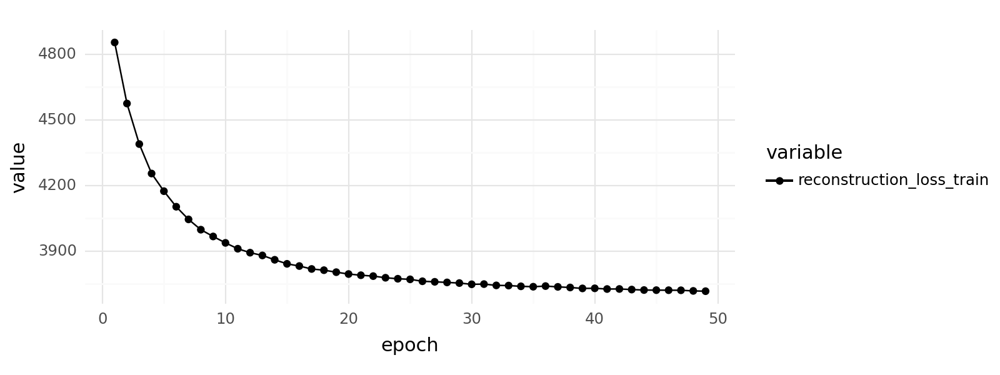

In [15]:
history_df = (
    model.history['reconstruction_loss_train'].astype(float)
    .reset_index()
    .melt(id_vars = ['epoch'])
)

p.options.figure_size = 8, 3

p_ = (
    p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
    + p.geom_line()
    + p.geom_point()
    + p.scale_color_manual({'reconstruction_loss_train': 'black', 'reconstruction_loss_validation': 'red'})
    + p.theme_minimal()
)

# p_.save('fig1.png', dpi = 300)

print(p_)

In [27]:
model.adata.obs['donor_number'] = model.adata.obs['donor'].str.split('-').str.get(-1)

INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


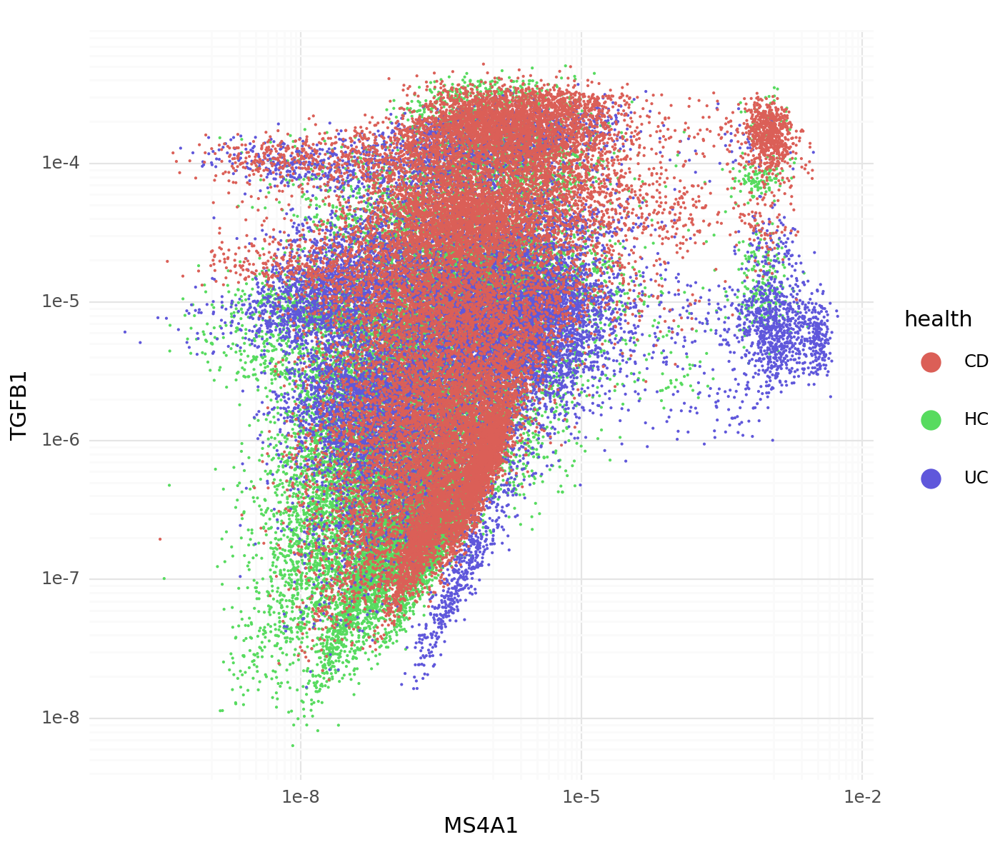

In [103]:
g1_, g2_ = 'MS4A1', 'TGFB1'

tmp_ = model_integrated.adata[model_integrated.adata.obs.index].copy()

gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_])
tmp_.obs['g1_'] =gexp_[g1_]
tmp_.obs['g2_'] =gexp_[g2_]


p.options.figure_size = 7, 6

p_ = (
    p.ggplot(p.aes(x = 'g1_', y = 'g2_', color = 'health'), tmp_.obs)
    + p.geom_point(shape = '.', size = 0.2)
    + p.scale_x_log10()
    + p.scale_y_log10()
    + p.theme_minimal()
    + p.guides(color = p.guide_legend(override_aes = {'size': 10}))
    + p.labs(x = g1_, y = g2_)
)

p_.save('fig1.png', dpi = 300)

print(p_)

INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


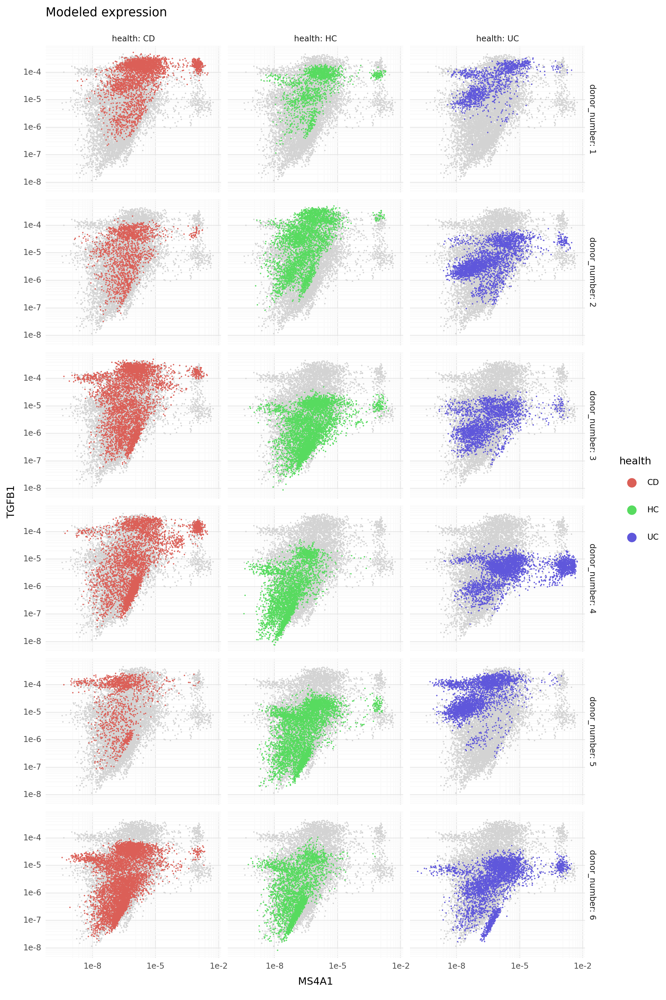

In [104]:
g1_, g2_ = 'MS4A1', 'TGFB1'

tmp_ = model_integrated.adata.copy()

gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_])
tmp_.obs['g1_'] = gexp_[g1_]
tmp_.obs['g2_'] = gexp_[g2_]

bg_ = tmp_.obs.sample(10_000).drop(['health', 'donor_number'], axis = 1)


p.options.figure_size = 10, 15

p_ = (
    p.ggplot(p.aes(x = 'g1_', y = 'g2_', color = 'health'), tmp_.obs)
    + p.geom_point(shape = '.', size = 0.2, color = 'lightgrey', data = bg_)
    + p.geom_point(shape = '.', size = 0.2)
    + p.scale_x_log10()
    + p.scale_y_log10()
    + p.theme_minimal()
    + p.guides(color = p.guide_legend(override_aes = {'size': 10}))
    + p.labs(x = g1_, y = g2_, title = 'Modeled expression')
    + p.facet_grid('donor_number ~ health', labeller = 'label_both')
)

p_.save('fig2.png', dpi = 300)

print(p_)

INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


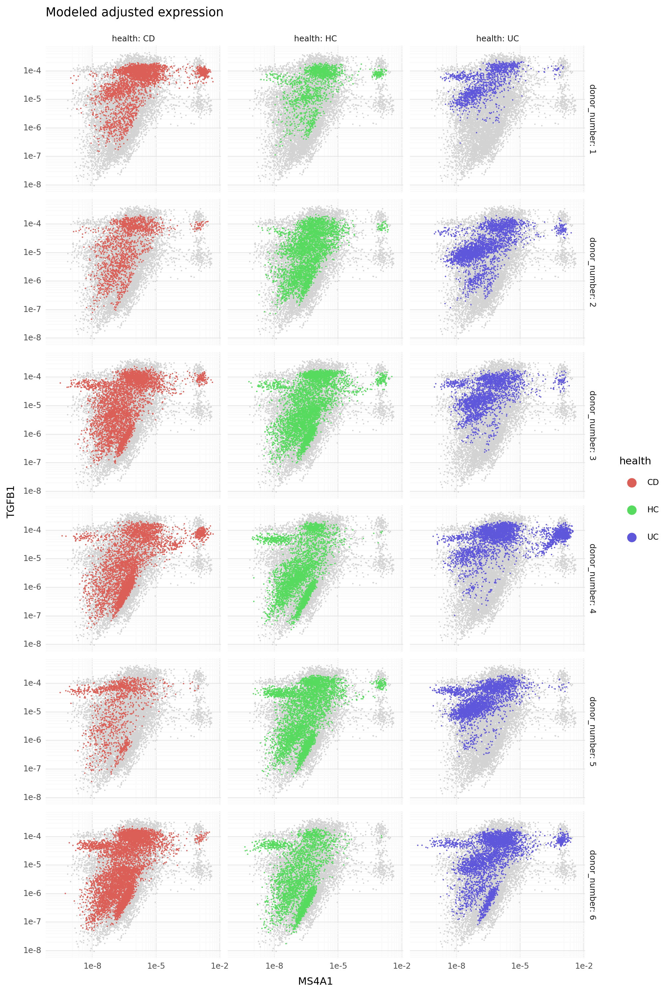

In [101]:
g1_, g2_ = 'MS4A1', 'TGFB1'

tmp_ = model_integrated.adata.copy()

gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_])
tmp_.obs['g1_'] = gexp_[g1_]
tmp_.obs['g2_'] = gexp_[g2_]

bg_ = tmp_.obs.sample(10_000).drop(['health', 'donor_number'], axis = 1)


gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_], transform_batch = 'HC-1')
tmp_.obs['g1_'] = gexp_[g1_]
tmp_.obs['g2_'] = gexp_[g2_]


p.options.figure_size = 10, 15

p_ = (
    p.ggplot(p.aes(x = 'g1_', y = 'g2_', color = 'health'), tmp_.obs)
    + p.geom_point(shape = '.', size = 0.2, color = 'lightgrey', data = bg_)
    + p.geom_point(shape = '.', size = 0.2)
    + p.scale_x_log10()
    + p.scale_y_log10()
    + p.theme_minimal()
    + p.guides(color = p.guide_legend(override_aes = {'size': 10}))
    + p.labs(x = g1_, y = g2_, title = 'Modeled adjusted expression')
    + p.facet_grid('donor_number ~ health', labeller = 'label_both')
)

print(p_)

INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


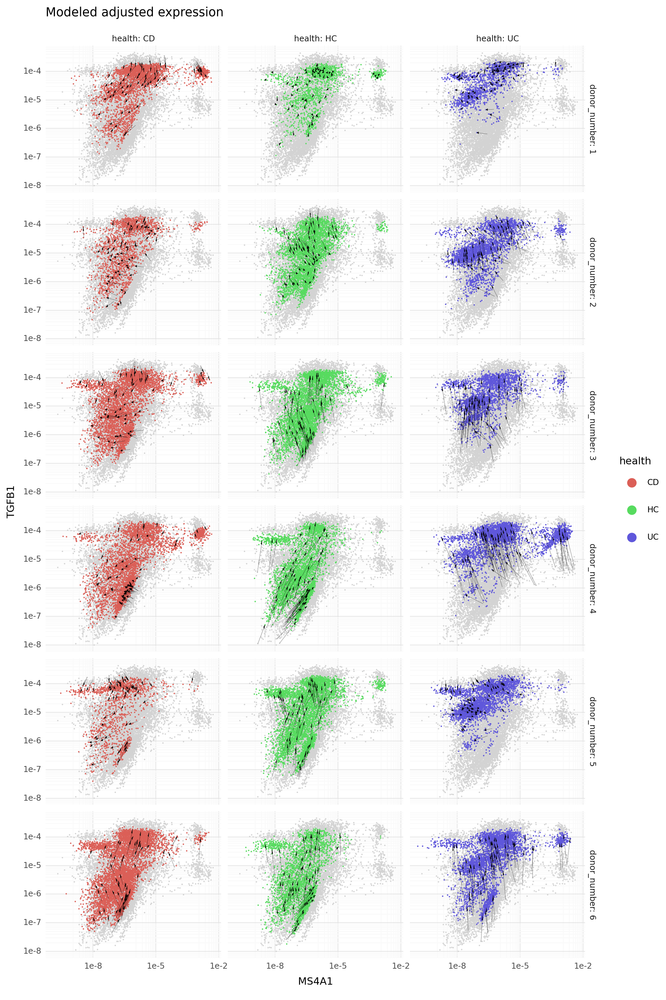

In [105]:
g1_, g2_ = 'MS4A1', 'TGFB1'

tmp_ = model_integrated.adata.copy()

gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_])
tmp_.obs['g1_'] = gexp_[g1_]
tmp_.obs['g2_'] = gexp_[g2_]

bg_ = tmp_.obs.sample(10_000).drop(['health', 'donor_number'], axis = 1)


gexp_ =  model_integrated.get_normalized_expression(adata = tmp_, gene_list = [g1_, g2_], transform_batch = 'HC-1')
tmp_.obs['g1_'] = gexp_[g1_]
tmp_.obs['g2_'] = gexp_[g2_]


tmp_.obs['layer'] = 'b'

bg__ = bg_.groupby(['donor'], observed = True).sample(64)

bg__['layer'] = 'a'

movement_ = pd.concat((
    tmp_.obs.loc[bg__.index].reset_index(),
    bg__.reset_index()
)).sort_values(['barcode', 'layer'])

movement_['donor_number'] = movement_['donor'].str.split('-').str.get(-1)
movement_['health'] = movement_['donor'].str.split('-').str.get(0)

movement_


p.options.figure_size = 10, 15

p_ = (
    p.ggplot(p.aes(x = 'g1_', y = 'g2_', color = 'health'), tmp_.obs)
    + p.geom_point(shape = '.', size = 0.2, color = 'lightgrey', data = bg_)
    + p.geom_point(shape = '.', size = 0.2)
    + p.geom_path(
        p.aes(group = 'barcode'),
        size = 0.1,
        color = 'k',
        arrow = p.arrow(angle = 15, length = 0.015, type = 'closed'),
        data = movement_
    )
    + p.scale_x_log10()
    + p.scale_y_log10()
    + p.theme_minimal()
    + p.guides(color = p.guide_legend(override_aes = {'size': 10}))
    + p.labs(x = g1_, y = g2_, title = 'Modeled adjusted expression')
    + p.facet_grid('donor_number ~ health', labeller = 'label_both')
)

p_.save('fig3.png', dpi = 300)

print(p_)